<a href="https://colab.research.google.com/github/Tung003/object-counter/blob/main/yolo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -U ultralytics
!pip install opencv-python
!pip install numpy

In [3]:
from google.colab.patches import cv2_imshow
from ultralytics import YOLO, SAM
import seaborn as sns
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt

#Open video Test

In [12]:
from IPython.display import HTML
from base64 import b64encode

mp4_path = '/content/drive/MyDrive/Colab Notebooks/object_counter/video_test1.mp4'
mp4 = open(mp4_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f"""
<video width=640 controls>
    <source src="{data_url}" type="video/mp4">
</video>
""")

#Open video train

In [8]:
from IPython.display import HTML
from base64 import b64encode

mp4_path = '/content/drive/MyDrive/Colab Notebooks/object_counter/video_train1.mp4'
mp4 = open(mp4_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f"""
<video width=640 controls>
    <source src="{data_url}" type="video/mp4">
</video>
""")

#Get frame from video train

In [ ]:
# get img from video
video_path="/home/chu-tung/Desktop/Deep_learning/truck_counting_YOLO/data/video_train2.mp4"
def get_frame(video_path, num_frame_get):
    cap = cv2.VideoCapture(video_path)
    frame_count=0
    num_frame_video=cv2.VideoCapture.get(cap, cv2.CAP_PROP_FRAME_COUNT)
    _space= num_frame_video // num_frame_get    # space between frames to save
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        frame_count+=1
        if frame_count % _space == 0:
            # print(f"frame_val2_{frame_count}.jpg")
            cv2.imwrite(f"/home/chu-tung/Desktop/Deep_learning/truck_counting_YOLO/data/images/val/frame_val2_{frame_count}.jpg", frame)
    cap.release()
    cv2.destroyAllWindows()
get_frame(video_path, num_frame_get=5)    #call to get frame for val dataset from video train

#Use SAM2 (Segment Anything Model 2) to segment objects in the image and get bounding box objects for YOLO model training purpose
#comment: the results from SAM2 are acceptable however if you want higher performance you can manually label



image 1/1 /content/drive/MyDrive/Colab Notebooks/object_counter/data_from_SAM2/data/images/train/frame_train_28.jpg: 1280x1280 1 0, 1 1, 1 2, 1 3, 1 4, 1 5, 1 6, 1 7, 1 8, 1 9, 1 10, 1 11, 1 12, 1 13, 1 14, 1 15, 1 16, 1 17, 1 18, 1 19, 1 20, 1 21, 1 22, 1 23, 1 24, 1 25, 1 26, 1 27, 1 28, 1 29, 1 30, 1 31, 1 32, 1 33, 1 34, 1 35, 1 36, 1 37, 1 38, 1 39, 1 40, 1 41, 1 42, 1 43, 1 44, 1 45, 1 46, 1 47, 1 48, 1 49, 1 50, 1 51, 1 52, 1 53, 1 54, 1 55, 1 56, 1 57, 1 58, 1 59, 1 60, 1 61, 1 62, 1 63, 1 64, 1 65, 1 66, 1 67, 1 68, 1 69, 1 70, 1 71, 1 72, 1 73, 1 74, 1 75, 1 76, 1 77, 1 78, 1 79, 1 80, 1 81, 1 82, 1 83, 1 84, 1 85, 1 86, 1 87, 1 88, 1 89, 1 90, 1 91, 1 92, 1 93, 1 94, 804.1ms
Speed: 9.1ms preprocess, 804.1ms inference, 2.3ms postprocess per image at shape (1, 3, 1280, 1280)


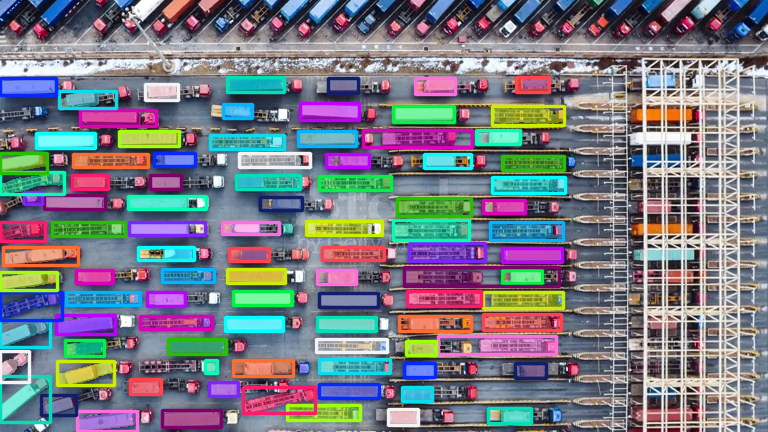

In [19]:
model=SAM("sam2.1_s.pt")
path_img='/content/drive/MyDrive/Colab Notebooks/object_counter/data_from_SAM2/data/images/train/frame_train_28.jpg'

results = model(path_img, points=[[31, 83], [85, 100], [168, 91], [256, 85], [346, 86], [438, 81], [534, 83], [541, 114], [419, 111], [333, 112], [233, 111], [99, 115], [60, 141], [21, 161], [52, 177], [30, 197], [70, 202], [32, 229], [45, 253], [33, 279], [49, 299], [16, 335], [9, 369], [25, 398], [58, 408], [99, 422], [146, 386], [82, 376], [87, 348], [87, 321], [109, 296], [96, 273], [181, 253], [107, 228], [167, 203], [171, 232], [166, 179], [99, 182], [113, 160], [159, 136], [181, 161], [255, 141], [277, 161], [259, 180], [289, 201], [249, 228], [257, 255], [265, 275], [265, 297], [167, 302], [195, 274], [190, 320], [252, 323], [202, 346], [209, 365], [229, 389], [209, 418], [283, 400], [259, 365], [341, 412], [352, 387], [351, 367], [354, 343], [357, 322], [360, 299], [350, 277], [359, 253], [350, 228], [351, 179], [355, 161], [339, 136], [415, 137], [443, 160], [438, 206], [443, 229], [442, 252], [443, 277], [449, 300], [429, 321], [423, 347], [422, 371], [424, 395], [407, 418], [518, 418], [535, 369], [528, 344], [527, 320], [527, 298], [527, 279], [532, 254], [535, 230], [517, 208], [528, 184], [540, 162], [514, 135]],
                imgsz=1280)
results[0].show(labels=False,)

#save bounding box object into file txt

check_points (polygon ROBOFLOW)

In [ ]:
check_points={
                'frame_train2_28.jpg':[[153, 26], [186, 48], [175, 73], [144, 98], [163, 118], [147, 164], [160, 189], [162, 212], [157, 234], [141, 259], [139, 278], [155, 302], [158, 327], [147, 350], [147, 369], [178, 398], [151, 420], [259, 422], [264, 398], [237, 372], [249, 326], [249, 304], [235, 281], [239, 257], [236, 236], [251, 210], [244, 185], [246, 166], [251, 143], [265, 118], [229, 94], [259, 76], [331, 42], [387, 40], [388, 40], [446, 20], [472, 42], [528, 8], [553, 33], [636, 22], [693, 20], [733, 28], [672, 85], [647, 78], [634, 57], [547, 50], [545, 67], [541, 92], [569, 113], [617, 134], [601, 160], [593, 187], [598, 210], [671, 201], [692, 156], [671, 132], [746, 73], [760, 102], [754, 161], [759, 195], [649, 233], [591, 237], [505, 237], [423, 259], [423, 280], [343, 310], [328, 350], [331, 375], [344, 397], [350, 427], [436, 424], [435, 396], [417, 377], [415, 353], [399, 334], [435, 308], [329, 280], [339, 257], [415, 238], [343, 235], [347, 211], [428, 208], [341, 190], [343, 169], [343, 146], [355, 123], [309, 96], [361, 77], [445, 75], [469, 94], [385, 98], [407, 134], [443, 148], [418, 166], [499, 168], [480, 188], [503, 213], [497, 257], [505, 279], [515, 306], [520, 332], [508, 351], [497, 376], [532, 399], [568, 420], [605, 398], [572, 376], [581, 356], [593, 331], [590, 305], [572, 257], [665, 252], [649, 281], [689, 299], [687, 326], [659, 351], [664, 370], [703, 390], [671, 421], [741, 362], [736, 326], [757, 250]],
                'frame_train2_56.jpg':[[172, 46], [180, 73], [254, 75], [341, 49], [382, 15], [431, 22], [470, 6], [576, 14], [646, 16], [689, 20], [724, 33], [738, 54], [635, 55], [563, 36], [472, 42], [549, 47], [547, 66], [644, 79], [675, 80], [736, 81], [668, 129], [575, 108], [626, 129], [488, 118], [545, 92], [468, 92], [460, 72], [388, 95], [308, 93], [344, 77], [238, 95], [156, 98], [167, 118], [149, 162], [155, 188], [151, 210], [151, 231], [156, 305], [149, 350], [149, 373], [108, 398], [158, 420], [265, 417], [264, 396], [250, 377], [264, 326], [261, 302], [253, 279], [254, 256], [236, 235], [248, 210], [245, 185], [249, 164], [254, 140], [260, 121], [360, 119], [330, 143], [336, 167], [340, 189], [333, 209], [334, 236], [331, 257], [331, 279], [341, 304], [335, 328], [333, 351], [327, 377], [359, 399], [344, 423], [442, 424], [566, 419], [533, 397], [625, 397], [708, 391], [668, 371], [571, 373], [509, 373], [438, 394], [415, 374], [415, 351], [501, 354], [577, 351], [662, 354], [733, 333], [691, 317], [611, 332], [516, 332], [426, 332], [435, 306], [522, 305], [612, 309], [696, 301], [685, 273], [658, 253], [583, 254], [588, 282], [517, 283], [428, 280], [425, 259], [508, 260], [516, 231], [426, 235], [432, 211], [428, 186], [425, 165], [455, 144], [415, 132], [532, 150], [508, 171], [504, 192], [509, 213], [593, 214], [599, 188], [598, 156], [680, 161], [676, 194], [668, 227], [745, 204], [590, 233], [731, 235], [760, 259], [744, 166], [737, 130]],
                'frame_train2_84.jpg':[[163, 51], [182, 6], [382, 32], [441, 23], [542, 21], [552, 33], [628, 25], [691, 20], [727, 27], [634, 56], [553, 49], [546, 67], [461, 75], [359, 77], [270, 72], [169, 73], [332, 45], [143, 97], [230, 97], [158, 118], [146, 166], [152, 192], [155, 217], [153, 279], [153, 305], [156, 326], [156, 351], [154, 372], [174, 401], [252, 372], [266, 424], [364, 424], [363, 399], [429, 397], [451, 426], [537, 397], [621, 399], [588, 420], [675, 422], [701, 393], [735, 363], [678, 371], [583, 374], [509, 377], [416, 372], [336, 377], [328, 351], [430, 352], [511, 355], [573, 355], [646, 355], [722, 340], [709, 315], [618, 331], [529, 335], [452, 332], [363, 331], [250, 329], [258, 307], [349, 303], [436, 305], [527, 309], [600, 309], [681, 305], [685, 273], [589, 281], [505, 283], [433, 282], [255, 281], [238, 256], [341, 259], [438, 259], [507, 263], [578, 261], [663, 256], [739, 239], [748, 202], [658, 229], [589, 237], [507, 236], [418, 235], [341, 236], [246, 236], [254, 208], [258, 186], [258, 165], [261, 140], [273, 120], [311, 92], [384, 98], [469, 95], [538, 96], [623, 93], [678, 79], [692, 91], [728, 91], [685, 118], [741, 123], [759, 158], [682, 195], [596, 211], [513, 212], [422, 211], [337, 213], [328, 187], [416, 186], [513, 190], [606, 184], [679, 167], [606, 160], [620, 131], [527, 145], [510, 167], [423, 170], [330, 167], [333, 143], [361, 117], [413, 131], [431, 145], [496, 119]],
                'frame_train2_112.jpg':[[157, 6], [257, 6], [362, 8], [458, 23], [562, 21], [631, 21], [696, 13], [734, 30], [627, 56], [560, 49], [544, 67], [461, 76], [353, 75], [268, 73], [176, 74], [352, 45], [141, 97], [232, 96], [302, 95], [376, 100], [472, 95], [470, 118], [542, 91], [570, 118], [632, 85], [675, 86], [702, 87], [733, 85], [679, 123], [622, 131], [537, 146], [450, 144], [417, 132], [338, 144], [352, 120], [277, 117], [159, 115], [267, 143], [154, 164], [251, 164], [343, 166], [417, 167], [503, 169], [607, 162], [674, 164], [744, 124], [750, 160], [674, 199], [588, 213], [591, 185], [507, 192], [422, 187], [338, 187], [264, 186], [173, 189], [164, 213], [254, 213], [327, 211], [421, 211], [501, 213], [570, 235], [701, 220], [749, 233], [631, 254], [516, 259], [490, 236], [425, 259], [410, 233], [326, 233], [338, 254], [263, 259], [237, 233], [180, 255], [172, 303], [160, 325], [148, 354], [152, 374], [168, 398], [179, 422], [307, 423], [246, 378], [253, 350], [323, 328], [254, 307], [258, 283], [361, 279], [343, 305], [434, 306], [443, 279], [528, 285], [619, 282], [524, 307], [507, 332], [399, 329], [321, 379], [356, 401], [441, 391], [421, 377], [507, 379], [514, 350], [576, 355], [619, 328], [696, 324], [601, 309], [700, 298], [763, 265], [737, 328], [750, 358], [757, 384], [703, 388], [614, 396], [548, 396], [560, 377], [636, 374], [641, 354], [580, 420], [686, 421]],
                'frame_train2_140.jpg':[[95, 47], [116, 164], [170, 190], [162, 210], [161, 232], [161, 257], [162, 279], [159, 304], [162, 328], [147, 373], [175, 396], [177, 425], [276, 424], [238, 371], [253, 353], [255, 325], [253, 305], [249, 258], [243, 236], [254, 208], [255, 185], [254, 164], [255, 138], [169, 117], [154, 96], [184, 73], [263, 73], [237, 93], [305, 95], [283, 115], [362, 126], [392, 97], [368, 70], [438, 76], [442, 20], [327, 1], [246, 6], [165, 4], [556, 20], [535, 39], [615, 30], [683, 27], [724, 29], [641, 56], [558, 52], [554, 66], [468, 95], [486, 118], [536, 95], [626, 91], [672, 86], [698, 91], [721, 91], [683, 116], [744, 122], [751, 165], [745, 200], [763, 207], [760, 227], [763, 265], [749, 297], [750, 325], [752, 349], [753, 380], [728, 416], [713, 386], [672, 371], [668, 348], [696, 316], [696, 296], [699, 269], [672, 254], [660, 229], [666, 203], [678, 161], [623, 129], [560, 112], [602, 163], [611, 187], [591, 210], [598, 255], [626, 283], [602, 305], [613, 330], [579, 355], [580, 375], [606, 394], [577, 421], [543, 397], [463, 392], [363, 397], [325, 370], [405, 376], [494, 377], [490, 353], [412, 351], [342, 354], [339, 329], [347, 305], [350, 280], [350, 258], [345, 234], [343, 210], [342, 188], [343, 167], [340, 138], [411, 133], [453, 148], [527, 149], [520, 166], [425, 164], [432, 187], [517, 191], [431, 208], [515, 217], [432, 236], [422, 259], [435, 282], [441, 305], [446, 336], [532, 334], [530, 304], [527, 282], [512, 258], [538, 236]],
                'frame_train2_168.jpg':[[169, 25], [353, 42], [451, 20], [469, 44], [549, 30], [645, 27], [693, 33], [725, 32], [746, 53], [634, 56], [550, 51], [546, 67], [462, 74], [356, 76], [262, 72], [251, 51], [177, 70], [149, 100], [237, 92], [168, 114], [167, 141], [178, 169], [162, 188], [167, 210], [135, 236], [252, 235], [160, 259], [167, 280], [157, 305], [167, 330], [248, 327], [248, 306], [253, 256], [257, 213], [255, 187], [248, 166], [249, 141], [261, 122], [314, 95], [388, 98], [361, 120], [346, 141], [346, 169], [342, 189], [336, 210], [338, 233], [336, 255], [339, 284], [345, 305], [353, 329], [240, 350], [157, 377], [239, 373], [177, 398], [182, 421], [281, 427], [352, 399], [350, 374], [402, 355], [432, 327], [434, 307], [426, 280], [420, 259], [418, 235], [418, 209], [416, 185], [421, 167], [425, 144], [479, 116], [471, 93], [531, 94], [625, 90], [670, 85], [683, 98], [749, 84], [749, 116], [672, 133], [610, 132], [579, 112], [522, 145], [524, 165], [512, 190], [511, 213], [500, 235], [507, 264], [514, 305], [519, 328], [479, 352], [457, 372], [435, 394], [433, 423], [568, 417], [525, 395], [614, 395], [570, 376], [575, 356], [610, 334], [606, 308], [592, 282], [585, 256], [591, 235], [589, 210], [592, 187], [597, 161], [680, 162], [672, 202], [675, 228], [668, 255], [688, 272], [692, 301], [722, 314], [654, 348], [672, 370], [697, 390], [740, 360], [731, 333], [760, 259], [756, 224], [752, 197], [750, 162]],
                'frame_train2_196.jpg':[[138, 52], [311, 7], [215, 9], [88, 7], [406, 9], [444, 21], [563, 15], [641, 17], [318, 47], [333, 25], [437, 44], [513, 38], [554, 50], [697, 28], [728, 32], [630, 56], [545, 68], [463, 75], [364, 76], [255, 75], [174, 72], [144, 98], [228, 97], [301, 96], [397, 97], [463, 94], [484, 118], [539, 93], [620, 92], [573, 115], [665, 89], [752, 48], [678, 100], [745, 85], [750, 120], [671, 135], [678, 167], [607, 160], [608, 131], [491, 146], [525, 162], [371, 144], [360, 121], [259, 120], [160, 121], [165, 142], [180, 166], [168, 188], [183, 211], [157, 236], [172, 259], [200, 303], [172, 328], [256, 326], [170, 349], [240, 353], [247, 376], [174, 395], [186, 421], [269, 425], [284, 400], [328, 375], [333, 354], [346, 331], [341, 308], [336, 280], [344, 258], [339, 234], [333, 210], [317, 189], [263, 168], [260, 145], [352, 164], [410, 185], [428, 171], [425, 209], [423, 238], [417, 258], [425, 281], [431, 305], [430, 334], [415, 353], [415, 378], [350, 429], [427, 423], [515, 398], [561, 417], [607, 397], [584, 373], [506, 351], [522, 329], [522, 307], [521, 284], [503, 260], [495, 238], [516, 210], [513, 188], [599, 185], [593, 210], [599, 237], [584, 256], [595, 283], [603, 303], [606, 330], [587, 355], [655, 350], [672, 373], [704, 391], [664, 427], [743, 418], [736, 357], [729, 334], [680, 322], [677, 301], [679, 275], [663, 256], [668, 225], [674, 201], [740, 167], [749, 201], [761, 222], [759, 269]],
                'frame_train_28.jpg':[[31, 83], [85, 100], [168, 91], [256, 85], [346, 86], [438, 81], [534, 83], [541, 114], [419, 111], [333, 112], [233, 111], [99, 115], [60, 141], [21, 161], [52, 177], [30, 197], [70, 202], [32, 229], [45, 253], [33, 279], [49, 299], [16, 335], [9, 369], [25, 398], [58, 408], [99, 422], [146, 386], [82, 376], [87, 348], [87, 321], [109, 296], [96, 273], [181, 253], [107, 228], [167, 203], [171, 232], [166, 179], [99, 182], [113, 160], [159, 136], [181, 161], [255, 141], [277, 161], [259, 180], [289, 201], [249, 228], [257, 255], [265, 275], [265, 297], [167, 302], [195, 274], [190, 320], [252, 323], [202, 346], [209, 365], [229, 389], [209, 418], [283, 400], [259, 365], [341, 412], [352, 387], [351, 367], [354, 343], [357, 322], [360, 299], [350, 277], [359, 253], [350, 228], [351, 179], [355, 161], [339, 136], [415, 137], [443, 160], [438, 206], [443, 229], [442, 252], [443, 277], [449, 300], [429, 321], [423, 347], [422, 371], [424, 395], [407, 418], [518, 418], [535, 369], [528, 344], [527, 320], [527, 298], [527, 279], [532, 254], [535, 230], [517, 208], [528, 184], [540, 162], [514, 135]],
                'frame_train_56.jpg':[[25, 65], [29, 92], [66, 121], [27, 142], [33, 165], [55, 183], [89, 161], [83, 139], [155, 118], [115, 99], [88, 76], [165, 73], [263, 63], [240, 90], [335, 91], [346, 62], [442, 64], [424, 95], [537, 64], [556, 96], [574, 118], [547, 142], [540, 163], [439, 143], [417, 115], [328, 119], [238, 120], [180, 139], [171, 160], [173, 182], [90, 207], [91, 233], [25, 258], [99, 258], [36, 280], [24, 310], [25, 339], [24, 377], [30, 417], [63, 384], [108, 404], [87, 353], [86, 325], [85, 302], [107, 278], [174, 280], [178, 255], [171, 232], [170, 208], [250, 208], [259, 180], [254, 161], [284, 137], [356, 139], [354, 164], [344, 185], [346, 207], [437, 187], [436, 210], [533, 213], [441, 235], [349, 235], [261, 233], [263, 257], [336, 256], [449, 258], [527, 281], [442, 278], [353, 280], [267, 279], [256, 305], [178, 303], [174, 324], [167, 345], [155, 368], [187, 399], [214, 423], [293, 417], [378, 422], [451, 422], [540, 420], [522, 396], [408, 399], [332, 392], [283, 379], [232, 368], [258, 348], [268, 324], [357, 327], [361, 348], [353, 300], [358, 369], [429, 374], [425, 350], [425, 326], [429, 302], [525, 300], [525, 325], [536, 349], [150, 426], [69, 420]],
                'frame_train_84.jpg':[[33, 43], [32, 71], [70, 103], [26, 122], [125, 121], [98, 143], [72, 167], [45, 138], [83, 191], [26, 214], [82, 214], [29, 238], [105, 237], [38, 260], [105, 259], [19, 293], [87, 286], [11, 328], [88, 308], [88, 332], [20, 355], [58, 369], [17, 407], [36, 418], [104, 383], [200, 373], [149, 402], [207, 404], [149, 346], [192, 326], [175, 302], [173, 281], [173, 258], [182, 234], [176, 212], [165, 187], [137, 155], [172, 139], [190, 116], [149, 96], [108, 76], [93, 53], [167, 51], [267, 43], [242, 76], [351, 43], [334, 72], [436, 77], [443, 47], [542, 42], [515, 98], [339, 96], [242, 101], [275, 119], [354, 120], [444, 121], [536, 122], [533, 145], [350, 144], [279, 141], [237, 165], [324, 165], [249, 190], [340, 191], [431, 165], [513, 165], [522, 191], [425, 184], [534, 216], [430, 213], [253, 212], [253, 236], [348, 239], [259, 261], [261, 282], [263, 306], [266, 329], [232, 351], [281, 361], [320, 371], [290, 398], [321, 419], [245, 419], [386, 400], [410, 377], [416, 421], [451, 398], [497, 425], [540, 396], [516, 378], [527, 330], [520, 306], [524, 282], [449, 258], [441, 237], [346, 262], [349, 283], [434, 281], [424, 310], [431, 330], [429, 353], [348, 351], [348, 327], [354, 307]],
                'frame_train_112.jpg':[[34, 24], [90, 38], [172, 31], [262, 25], [346, 27], [444, 27], [540, 23], [500, 55], [373, 53], [331, 78], [247, 81], [148, 79], [116, 58], [73, 83], [24, 102], [117, 101], [181, 101], [278, 101], [353, 104], [445, 102], [511, 80], [547, 103], [544, 125], [445, 125], [173, 123], [91, 120], [72, 148], [173, 142], [272, 146], [370, 147], [529, 146], [524, 174], [432, 170], [336, 169], [250, 169], [162, 167], [91, 172], [64, 195], [52, 224], [163, 192], [250, 194], [327, 199], [424, 191], [420, 220], [516, 218], [338, 217], [267, 214], [169, 212], [103, 240], [87, 263], [86, 292], [84, 317], [22, 338], [9, 308], [13, 275], [271, 243], [202, 239], [177, 265], [173, 284], [162, 309], [141, 328], [59, 346], [20, 384], [35, 399], [52, 419], [129, 424], [135, 405], [137, 380], [117, 358], [176, 362], [225, 331], [264, 308], [268, 289], [265, 262], [340, 264], [358, 239], [441, 241], [433, 266], [525, 263], [520, 285], [544, 312], [426, 291], [427, 310], [351, 308], [345, 286], [280, 342], [355, 329], [425, 336], [521, 358], [534, 381], [514, 402], [424, 404], [447, 380], [407, 360], [319, 353], [370, 380], [333, 399], [290, 377], [211, 381], [228, 401]],
                'frame_train_140.jpg':[[28, 7], [45, 25], [117, 40], [175, 10], [260, 11], [348, 7], [448, 8], [540, 6], [502, 37], [414, 37], [323, 27], [228, 34], [153, 59], [70, 59], [24, 84], [24, 109], [109, 82], [107, 99], [175, 83], [267, 83], [247, 63], [330, 57], [348, 86], [438, 84], [499, 59], [528, 85], [433, 106], [344, 106], [267, 102], [201, 103], [159, 127], [82, 127], [75, 151], [70, 175], [91, 200], [32, 222], [23, 253], [12, 289], [90, 269], [89, 245], [133, 219], [182, 198], [151, 172], [170, 149], [250, 149], [246, 120], [331, 125], [453, 129], [535, 127], [520, 153], [423, 157], [336, 147], [241, 174], [332, 175], [520, 174], [520, 199], [427, 195], [334, 198], [259, 197], [245, 217], [178, 241], [175, 263], [266, 246], [349, 219], [452, 219], [532, 220], [522, 246], [437, 245], [351, 245], [268, 269], [173, 290], [83, 294], [18, 317], [10, 349], [24, 362], [58, 326], [43, 372], [55, 401], [132, 388], [130, 405], [165, 419], [140, 365], [111, 341], [141, 307], [233, 310], [204, 338], [262, 290], [356, 289], [355, 266], [418, 270], [514, 263], [569, 293], [426, 292], [430, 314], [356, 314], [330, 335], [295, 318], [287, 362], [219, 362], [230, 384], [324, 381], [378, 361], [405, 337], [518, 335], [538, 358], [508, 382], [407, 383], [452, 364], [597, 410]],
                'frame_train_168.jpg':[[64, 43], [20, 8], [21, 66], [22, 88], [72, 106], [15, 133], [86, 154], [31, 177], [20, 207], [21, 235], [14, 272], [28, 290], [17, 325], [21, 342], [45, 358], [55, 383], [115, 320], [76, 304], [82, 272], [89, 246], [90, 225], [85, 197], [103, 176], [162, 129], [93, 130], [160, 107], [117, 82], [118, 62], [148, 37], [117, 19], [228, 62], [244, 42], [251, 15], [320, 6], [405, 16], [498, 13], [334, 35], [514, 39], [526, 63], [443, 59], [272, 82], [198, 84], [243, 105], [326, 104], [442, 85], [435, 112], [524, 105], [529, 134], [432, 135], [344, 130], [252, 129], [253, 154], [179, 177], [185, 203], [257, 200], [265, 174], [344, 155], [508, 156], [418, 181], [337, 181], [532, 181], [557, 201], [449, 202], [349, 203], [263, 227], [173, 223], [185, 248], [264, 246], [353, 246], [353, 226], [424, 223], [531, 224], [426, 250], [525, 245], [522, 268], [422, 273], [334, 269], [260, 268], [157, 267], [159, 292], [245, 291], [340, 292], [420, 292], [534, 294], [517, 317], [410, 319], [328, 316], [206, 319], [143, 343], [143, 365], [133, 386], [144, 406], [34, 409], [215, 394], [232, 417], [333, 394], [448, 389], [430, 365], [505, 365], [451, 345], [542, 343], [377, 344], [285, 338], [254, 364], [205, 348], [531, 415], [335, 360]],
                'frame_train_196.jpg':[[67, 22], [19, 44], [33, 62], [26, 88], [26, 114], [18, 141], [42, 160], [24, 184], [21, 218], [18, 250], [21, 276], [27, 296], [31, 315], [43, 335], [55, 361], [35, 408], [129, 404], [175, 380], [132, 364], [140, 348], [143, 322], [118, 301], [82, 282], [86, 253], [91, 228], [91, 205], [87, 181], [104, 159], [98, 133], [92, 112], [83, 85], [107, 63], [100, 39], [160, 20], [192, 44], [178, 64], [166, 87], [163, 112], [164, 135], [175, 159], [190, 179], [179, 203], [179, 227], [156, 252], [202, 276], [198, 299], [220, 322], [231, 342], [244, 372], [244, 395], [284, 411], [349, 394], [364, 368], [425, 343], [504, 347], [554, 369], [582, 410], [458, 410], [358, 410], [323, 342], [293, 320], [375, 322], [409, 299], [419, 273], [427, 251], [511, 256], [517, 272], [524, 301], [540, 321], [512, 227], [500, 204], [516, 183], [507, 159], [488, 111], [505, 90], [412, 90], [528, 69], [444, 65], [437, 42], [530, 23], [406, 21], [356, 43], [262, 44], [258, 62], [356, 64], [351, 85], [254, 89], [248, 112], [340, 110], [351, 138], [266, 138], [261, 158], [343, 160], [347, 184], [268, 180], [264, 204], [269, 232], [263, 246], [339, 250], [369, 232], [361, 204], [307, 273], [331, 297]],
                'frame_train3_28.jpg':[[154, 25], [191, 50], [181, 74], [151, 98], [167, 119], [145, 166], [162, 188], [157, 211], [156, 236], [152, 256], [146, 277], [157, 298], [169, 329], [153, 348], [149, 372], [173, 399], [156, 417], [254, 424], [266, 396], [243, 375], [247, 328], [252, 302], [242, 280], [244, 255], [238, 235], [254, 208], [246, 185], [242, 166], [251, 143], [268, 114], [230, 94], [258, 73], [327, 44], [306, 92], [355, 76], [390, 47], [440, 21], [463, 44], [459, 73], [396, 98], [365, 118], [332, 140], [332, 166], [334, 187], [333, 208], [337, 232], [340, 255], [330, 278], [348, 303], [390, 331], [328, 352], [331, 374], [351, 393], [352, 422], [439, 424], [441, 390], [409, 371], [426, 349], [433, 305], [425, 281], [419, 255], [417, 232], [425, 207], [485, 187], [419, 167], [436, 146], [413, 130], [483, 117], [475, 91], [536, 70], [552, 52], [552, 34], [541, 1], [631, 23], [680, 32], [724, 35], [673, 83], [644, 80], [623, 57], [546, 90], [569, 112], [524, 146], [510, 167], [512, 210], [505, 236], [497, 256], [506, 282], [517, 304], [523, 331], [500, 355], [500, 374], [527, 397], [569, 419], [614, 393], [698, 392], [740, 357], [665, 373], [655, 352], [575, 376], [572, 352], [593, 333], [600, 304], [685, 297], [642, 279], [576, 261], [579, 238], [655, 230], [664, 253], [738, 261], [740, 207], [739, 170], [744, 115], [737, 79], [681, 122], [607, 135], [606, 160], [596, 186], [595, 208], [675, 200], [685, 159], [683, 327], [727, 333], [681, 420]],
                'frame_train3_56.jpg':[[164, 48], [181, 72], [144, 98], [165, 119], [147, 162], [162, 190], [158, 210], [158, 233], [156, 302], [154, 349], [153, 369], [150, 419], [255, 425], [265, 397], [249, 374], [254, 326], [254, 302], [236, 279], [243, 256], [240, 236], [243, 211], [250, 186], [249, 167], [252, 141], [257, 118], [235, 98], [258, 72], [312, 95], [368, 74], [357, 47], [386, 13], [432, 23], [470, 8], [470, 41], [432, 76], [389, 97], [359, 120], [322, 142], [335, 170], [338, 188], [333, 212], [337, 233], [340, 256], [328, 280], [341, 307], [329, 330], [332, 351], [330, 372], [352, 397], [350, 425], [439, 425], [441, 395], [412, 372], [413, 348], [417, 331], [430, 304], [419, 280], [415, 258], [419, 235], [424, 208], [411, 186], [418, 165], [444, 147], [406, 135], [493, 119], [473, 93], [538, 69], [552, 52], [557, 39], [568, 12], [640, 15], [636, 58], [687, 22], [727, 29], [679, 76], [633, 82], [542, 89], [561, 112], [522, 147], [510, 172], [506, 190], [509, 213], [505, 235], [500, 260], [506, 282], [514, 306], [511, 329], [511, 350], [501, 376], [523, 398], [560, 417], [602, 399], [572, 373], [574, 345], [599, 338], [597, 301], [594, 284], [575, 257], [582, 238], [587, 210], [591, 187], [587, 167], [606, 132], [669, 135], [731, 57], [741, 75], [748, 121], [670, 169], [672, 199], [655, 229], [663, 252], [680, 279], [688, 297], [686, 316], [661, 348], [667, 370], [689, 393], [675, 420], [739, 360], [729, 331], [750, 267], [739, 232], [739, 210], [742, 169]],
                'frame_train3_84.jpg':[[180, 4], [161, 52], [176, 73], [148, 96], [162, 118], [146, 162], [167, 190], [167, 213], [152, 280], [156, 304], [161, 327], [153, 349], [145, 371], [164, 397], [251, 424], [241, 374], [246, 329], [250, 305], [248, 280], [240, 257], [240, 237], [256, 208], [248, 186], [246, 163], [246, 142], [262, 120], [225, 94], [258, 72], [338, 46], [367, 32], [430, 20], [437, 5], [361, 74], [299, 94], [356, 124], [381, 97], [331, 143], [333, 165], [337, 186], [328, 208], [335, 234], [337, 261], [329, 304], [353, 329], [328, 348], [329, 373], [346, 394], [343, 422], [442, 424], [442, 393], [415, 373], [417, 354], [448, 333], [427, 306], [426, 279], [422, 258], [421, 233], [424, 211], [417, 186], [420, 165], [438, 146], [409, 130], [465, 98], [447, 74], [544, 70], [555, 50], [542, 36], [547, 21], [608, 32], [636, 58], [688, 22], [727, 33], [682, 75], [645, 78], [543, 89], [480, 115], [570, 115], [515, 151], [513, 167], [512, 190], [512, 208], [515, 230], [504, 257], [512, 278], [520, 306], [543, 332], [510, 353], [496, 378], [529, 397], [572, 422], [611, 397], [702, 392], [747, 359], [665, 372], [578, 375], [578, 353], [646, 353], [719, 341], [700, 318], [623, 329], [600, 305], [601, 279], [684, 300], [675, 277], [584, 258], [584, 235], [587, 209], [590, 183], [601, 164], [619, 131], [681, 100], [689, 117], [732, 85], [749, 122], [677, 162], [677, 193], [752, 162], [758, 196], [667, 226], [735, 233], [758, 265]],
                'frame_train3_112.jpg':[[156, 7], [252, 6], [366, 7], [452, 19], [544, 21], [624, 25], [688, 21], [732, 30], [544, 34], [558, 49], [634, 57], [545, 68], [550, 92], [632, 89], [676, 78], [692, 97], [729, 88], [750, 119], [666, 129], [623, 129], [581, 114], [484, 117], [517, 146], [507, 167], [597, 164], [502, 192], [599, 187], [675, 167], [747, 168], [676, 197], [593, 209], [516, 213], [485, 237], [509, 259], [523, 281], [518, 306], [498, 338], [499, 351], [498, 376], [531, 398], [572, 421], [611, 398], [578, 373], [573, 354], [606, 328], [599, 304], [604, 283], [623, 256], [579, 235], [703, 223], [734, 237], [755, 270], [685, 300], [698, 319], [660, 347], [666, 372], [684, 393], [731, 365], [756, 415], [679, 420], [728, 331], [447, 396], [415, 377], [415, 331], [424, 306], [431, 281], [417, 257], [416, 236], [423, 212], [418, 188], [417, 167], [438, 148], [404, 135], [397, 98], [469, 93], [445, 77], [321, 45], [354, 78], [312, 96], [354, 123], [331, 143], [333, 166], [333, 185], [333, 207], [321, 235], [337, 257], [343, 277], [338, 307], [323, 328], [325, 374], [351, 396], [305, 419], [190, 422], [175, 396], [245, 377], [145, 373], [139, 351], [233, 353], [153, 329], [159, 300], [253, 305], [251, 281], [251, 257], [161, 259], [240, 235], [165, 212], [170, 189], [149, 165], [162, 120], [144, 98], [177, 69], [252, 73], [239, 94], [281, 121], [264, 140], [262, 168], [252, 186], [248, 208]],
                'frame_train3_140.jpg':[[181, 74], [156, 6], [243, 6], [332, 6], [449, 18], [553, 19], [517, 37], [611, 30], [690, 19], [731, 26], [152, 91], [255, 69], [357, 77], [433, 74], [542, 69], [550, 52], [632, 56], [232, 94], [301, 94], [163, 116], [121, 163], [160, 189], [156, 210], [153, 234], [159, 256], [159, 278], [160, 301], [155, 329], [145, 370], [173, 393], [182, 420], [269, 425], [231, 375], [238, 349], [249, 326], [251, 305], [244, 259], [234, 232], [246, 213], [247, 185], [248, 164], [243, 143], [270, 116], [354, 122], [385, 98], [334, 142], [329, 166], [340, 188], [333, 209], [341, 235], [331, 256], [354, 279], [343, 307], [343, 326], [339, 350], [325, 371], [343, 395], [344, 422], [446, 426], [431, 391], [411, 369], [403, 353], [426, 334], [424, 304], [430, 283], [422, 257], [427, 238], [422, 209], [415, 187], [421, 163], [461, 144], [409, 135], [485, 119], [473, 89], [546, 92], [571, 120], [624, 91], [621, 131], [518, 149], [509, 167], [509, 185], [514, 209], [592, 191], [599, 161], [671, 132], [678, 100], [673, 82], [724, 93], [747, 121], [668, 167], [678, 197], [748, 168], [597, 209], [548, 235], [505, 257], [518, 283], [524, 307], [523, 328], [489, 354], [495, 373], [528, 393], [565, 417], [606, 398], [575, 377], [568, 353], [609, 327], [596, 305], [601, 285], [593, 254], [651, 233], [664, 258], [691, 272], [750, 236], [731, 204], [760, 267], [689, 301], [684, 320], [659, 349], [669, 369], [702, 389], [739, 359], [734, 329], [735, 304], [756, 378], [726, 413], [645, 429]],
                'frame_train3_168.jpg':[[149, 9], [238, 6], [156, 21], [248, 51], [251, 71], [168, 76], [150, 99], [166, 117], [159, 141], [169, 166], [166, 186], [165, 214], [128, 235], [156, 258], [157, 281], [156, 302], [163, 327], [154, 374], [168, 397], [176, 420], [268, 424], [246, 375], [235, 351], [252, 327], [252, 303], [248, 258], [236, 234], [244, 213], [244, 189], [253, 167], [250, 142], [266, 117], [239, 94], [312, 94], [358, 76], [358, 42], [442, 20], [463, 42], [436, 77], [388, 98], [362, 119], [344, 141], [345, 163], [343, 188], [337, 212], [342, 236], [332, 257], [339, 279], [344, 302], [351, 330], [392, 353], [352, 373], [349, 396], [344, 423], [421, 428], [441, 393], [472, 376], [478, 356], [428, 333], [433, 307], [431, 279], [420, 256], [416, 234], [419, 213], [420, 184], [427, 169], [426, 150], [482, 116], [475, 87], [544, 69], [556, 50], [555, 25], [654, 26], [633, 55], [549, 89], [570, 115], [521, 145], [522, 167], [507, 189], [507, 210], [510, 235], [508, 260], [520, 304], [523, 330], [563, 353], [576, 372], [533, 395], [569, 422], [608, 397], [662, 428], [753, 418], [705, 390], [660, 373], [666, 346], [609, 333], [596, 304], [594, 280], [585, 255], [595, 236], [591, 211], [590, 187], [596, 163], [606, 130], [623, 91], [682, 42], [724, 31], [751, 52], [671, 82], [678, 102], [686, 125], [673, 167], [682, 193], [679, 225], [668, 253], [690, 273], [689, 298], [720, 310], [739, 333], [744, 359], [756, 378], [754, 264], [754, 232], [749, 201], [741, 167], [732, 128], [729, 98]],
                'frame_train3_196.jpg':[[212, 8], [308, 8], [133, 52], [175, 72], [147, 97], [166, 118], [163, 142], [180, 167], [167, 187], [183, 211], [152, 235], [175, 261], [204, 303], [172, 328], [158, 353], [167, 395], [180, 424], [240, 377], [228, 354], [252, 326], [269, 393], [259, 422], [320, 376], [347, 425], [327, 349], [333, 331], [339, 303], [335, 280], [336, 258], [335, 235], [334, 211], [319, 191], [257, 168], [254, 145], [257, 116], [232, 94], [255, 73], [313, 50], [333, 27], [389, 7], [446, 16], [436, 42], [364, 77], [307, 96], [386, 95], [347, 118], [358, 140], [340, 164], [424, 166], [415, 187], [419, 211], [419, 239], [417, 257], [418, 282], [431, 304], [428, 326], [418, 353], [419, 375], [425, 421], [561, 421], [526, 394], [492, 372], [503, 355], [526, 330], [519, 304], [517, 281], [506, 258], [505, 236], [513, 211], [509, 188], [523, 162], [481, 141], [486, 117], [469, 91], [454, 74], [503, 37], [561, 14], [548, 54], [542, 66], [543, 94], [568, 112], [598, 136], [596, 163], [596, 184], [589, 212], [594, 236], [584, 256], [596, 285], [597, 305], [602, 330], [584, 351], [585, 376], [605, 396], [656, 429], [742, 417], [700, 392], [671, 373], [660, 351], [673, 324], [674, 301], [672, 275], [664, 254], [663, 228], [666, 199], [669, 167], [667, 135], [661, 114], [658, 93], [643, 80], [635, 57], [641, 12], [683, 39], [718, 39], [749, 48], [745, 86], [742, 122], [746, 162], [752, 197], [751, 229], [755, 266], [755, 294], [735, 331], [742, 352], [753, 377]],
                'frame_val_40.jpg':[[27, 77], [83, 90], [166, 81], [261, 77], [342, 77], [441, 79], [539, 77], [533, 107], [426, 104], [323, 103], [236, 103], [109, 108], [59, 133], [20, 154], [53, 171], [140, 151], [150, 127], [244, 133], [335, 128], [418, 131], [513, 130], [537, 153], [437, 153], [356, 150], [272, 150], [178, 150], [161, 171], [53, 193], [85, 222], [84, 243], [29, 269], [83, 290], [104, 266], [172, 243], [166, 218], [160, 189], [251, 192], [282, 176], [351, 171], [351, 196], [426, 198], [349, 222], [355, 246], [349, 270], [349, 288], [353, 317], [347, 334], [266, 316], [265, 289], [262, 267], [256, 244], [252, 220], [185, 265], [172, 288], [184, 316], [87, 312], [88, 340], [89, 366], [70, 391], [114, 413], [195, 411], [232, 378], [156, 376], [183, 359], [179, 335], [252, 339], [272, 360], [362, 360], [284, 391], [326, 407], [353, 383], [425, 387], [407, 408], [426, 359], [427, 337], [433, 315], [446, 287], [443, 269], [445, 241], [443, 223], [513, 198], [536, 172], [533, 221], [537, 246], [533, 267], [533, 286], [530, 312], [531, 334], [541, 360], [525, 403]],
                'frame_val_80.jpg':[[26, 48], [86, 61], [164, 55], [261, 45], [347, 48], [452, 48], [535, 48], [530, 77], [514, 101], [536, 125], [533, 147], [526, 169], [530, 195], [534, 217], [522, 286], [522, 308], [528, 334], [521, 377], [534, 399], [506, 426], [426, 427], [451, 405], [406, 379], [423, 356], [427, 330], [431, 315], [434, 286], [450, 263], [443, 240], [437, 217], [431, 192], [440, 169], [443, 123], [356, 125], [339, 98], [340, 73], [420, 79], [238, 73], [112, 78], [75, 105], [23, 125], [108, 124], [157, 100], [249, 101], [279, 126], [182, 121], [164, 147], [94, 146], [56, 170], [30, 145], [97, 190], [94, 215], [165, 191], [174, 217], [146, 164], [236, 167], [320, 168], [263, 147], [361, 142], [342, 192], [264, 192], [262, 215], [348, 243], [254, 240], [187, 239], [110, 240], [23, 243], [27, 266], [22, 296], [94, 288], [96, 260], [180, 259], [271, 263], [342, 261], [352, 288], [267, 286], [176, 284], [179, 306], [92, 309], [91, 336], [69, 367], [160, 351], [180, 330], [251, 331], [269, 311], [352, 308], [360, 329], [353, 352], [280, 364], [237, 351], [204, 380], [117, 381], [63, 407], [141, 410], [215, 407], [289, 403], [367, 402], [340, 425], [329, 374], [241, 420], [21, 410], [20, 356], [15, 334], [142, 431]],
                'frame_val_120.jpg':[[34, 21], [81, 31], [178, 27], [322, 42], [357, 19], [441, 21], [533, 19], [497, 51], [418, 48], [332, 75], [228, 80], [143, 75], [122, 51], [72, 76], [24, 98], [102, 95], [69, 117], [66, 143], [19, 168], [81, 166], [75, 186], [87, 215], [42, 238], [42, 211], [22, 267], [97, 261], [95, 286], [24, 296], [22, 331], [83, 302], [87, 328], [21, 380], [53, 384], [111, 357], [55, 413], [146, 403], [129, 421], [142, 376], [219, 376], [229, 397], [202, 352], [145, 324], [185, 301], [177, 280], [175, 258], [195, 233], [129, 234], [177, 212], [165, 186], [168, 162], [161, 140], [147, 115], [178, 91], [272, 93], [275, 116], [247, 137], [248, 161], [256, 189], [267, 211], [267, 231], [257, 258], [262, 279], [261, 302], [231, 325], [277, 336], [325, 349], [302, 373], [331, 393], [387, 374], [430, 399], [466, 425], [507, 397], [537, 373], [450, 376], [409, 356], [517, 354], [532, 307], [424, 330], [421, 304], [357, 326], [353, 303], [352, 284], [356, 259], [417, 259], [417, 281], [552, 282], [558, 258], [559, 210], [419, 211], [343, 213], [324, 191], [461, 189], [462, 165], [559, 169], [562, 141], [583, 118], [571, 96], [541, 71], [479, 96], [432, 120], [351, 96], [341, 137], [427, 144], [522, 140], [344, 165]],
                'frame_val_160.jpg':[[31, 13], [113, 26], [61, 48], [25, 67], [105, 72], [160, 47], [188, 70], [255, 52], [258, 22], [331, 13], [426, 20], [498, 20], [511, 45], [533, 69], [416, 67], [336, 47], [277, 65], [215, 87], [110, 89], [29, 91], [26, 113], [86, 111], [206, 113], [279, 89], [356, 91], [310, 112], [405, 115], [525, 116], [553, 140], [465, 137], [376, 137], [289, 137], [204, 136], [122, 136], [68, 157], [163, 161], [298, 164], [406, 164], [427, 183], [528, 185], [341, 186], [261, 183], [185, 180], [100, 184], [88, 202], [28, 208], [25, 237], [12, 275], [77, 283], [94, 254], [100, 232], [192, 229], [245, 232], [281, 202], [351, 209], [458, 210], [531, 206], [529, 228], [433, 231], [348, 230], [272, 255], [188, 248], [153, 276], [148, 295], [58, 312], [26, 350], [48, 359], [58, 384], [128, 392], [138, 371], [138, 348], [123, 328], [208, 326], [218, 351], [223, 369], [218, 395], [138, 413], [225, 422], [334, 396], [328, 368], [291, 347], [319, 321], [323, 300], [250, 290], [263, 272], [350, 275], [414, 275], [359, 253], [433, 259], [506, 256], [518, 276], [430, 297], [411, 323], [382, 347], [444, 347], [424, 371], [434, 392], [498, 366], [545, 348], [527, 327], [516, 304], [184, 207]],
                'frame_val_200.jpg':[[133, 19], [234, 18], [407, 20], [521, 20], [483, 39], [513, 68], [514, 90], [518, 113], [523, 159], [533, 182], [533, 203], [524, 224], [532, 246], [534, 273], [529, 292], [539, 319], [512, 341], [445, 371], [429, 342], [455, 321], [414, 295], [430, 270], [437, 246], [441, 225], [395, 202], [349, 182], [353, 157], [353, 136], [421, 108], [427, 89], [439, 64], [358, 40], [353, 64], [337, 82], [251, 87], [267, 60], [268, 41], [195, 43], [101, 40], [27, 42], [29, 64], [99, 62], [183, 61], [167, 85], [83, 84], [27, 88], [35, 108], [36, 129], [115, 110], [151, 109], [161, 131], [91, 130], [95, 156], [184, 152], [271, 134], [254, 107], [281, 154], [264, 175], [199, 180], [255, 203], [263, 230], [339, 251], [331, 272], [353, 294], [255, 273], [289, 246], [198, 246], [216, 222], [188, 208], [111, 201], [101, 176], [95, 228], [91, 253], [163, 280], [195, 302], [107, 302], [77, 272], [32, 269], [23, 243], [28, 209], [38, 186], [51, 155], [29, 319], [45, 335], [58, 357], [81, 389], [133, 364], [147, 344], [212, 323], [142, 321], [223, 340], [285, 320], [312, 339], [380, 322], [349, 392], [245, 395], [277, 368], [179, 374], [188, 403], [312, 406], [435, 409], [510, 407]],
                'frame_val2_40.jpg':[[167, 46], [185, 73], [275, 76], [143, 102], [162, 116], [237, 97], [299, 96], [351, 77], [349, 32], [383, 44], [438, 23], [466, 44], [506, 17], [605, 31], [555, 52], [550, 73], [631, 60], [673, 38], [713, 40], [675, 82], [648, 78], [735, 83], [678, 126], [625, 130], [569, 112], [541, 92], [467, 93], [449, 73], [399, 98], [361, 123], [285, 118], [269, 138], [154, 164], [266, 169], [334, 168], [341, 142], [411, 134], [425, 146], [515, 148], [502, 113], [601, 163], [676, 164], [742, 171], [759, 198], [679, 191], [605, 186], [595, 207], [515, 215], [507, 191], [511, 169], [425, 168], [426, 184], [427, 211], [421, 238], [345, 236], [338, 211], [337, 188], [261, 185], [259, 214], [172, 212], [175, 186], [157, 235], [242, 238], [157, 258], [252, 258], [346, 263], [434, 260], [498, 257], [575, 258], [657, 254], [685, 274], [695, 303], [705, 319], [727, 335], [737, 360], [759, 388], [709, 388], [606, 398], [658, 377], [633, 358], [628, 332], [610, 307], [604, 278], [503, 277], [520, 304], [528, 331], [521, 355], [591, 356], [588, 372], [505, 372], [531, 396], [571, 419], [445, 425], [433, 397], [420, 376], [429, 355], [431, 336], [433, 307], [430, 281], [337, 276], [348, 304], [339, 330], [333, 351], [333, 374], [345, 398], [342, 420], [269, 426], [253, 395], [240, 376], [252, 329], [252, 304], [249, 282], [156, 280], [164, 303], [165, 330], [124, 350], [118, 373], [141, 397], [120, 424], [154, 3]],
                'frame_val2_80.jpg':[[179, 48], [183, 70], [149, 99], [165, 119], [149, 164], [163, 189], [159, 208], [239, 236], [232, 256], [159, 280], [159, 304], [166, 328], [155, 351], [149, 372], [157, 396], [154, 418], [261, 424], [242, 374], [256, 328], [257, 304], [259, 282], [265, 210], [262, 184], [262, 162], [263, 144], [277, 116], [301, 96], [235, 95], [260, 73], [265, 4], [332, 50], [409, 44], [435, 25], [477, 11], [559, 18], [626, 28], [694, 15], [730, 32], [632, 58], [551, 52], [556, 35], [549, 68], [459, 72], [359, 79], [397, 95], [475, 89], [536, 91], [626, 90], [669, 80], [693, 92], [721, 92], [686, 124], [619, 134], [579, 116], [465, 116], [410, 127], [358, 124], [341, 144], [342, 169], [463, 146], [533, 146], [603, 164], [685, 163], [729, 137], [610, 186], [524, 170], [423, 165], [425, 186], [332, 190], [335, 207], [331, 235], [345, 258], [341, 306], [351, 334], [337, 351], [335, 376], [355, 395], [348, 425], [443, 425], [452, 393], [402, 372], [421, 351], [445, 328], [435, 307], [432, 275], [429, 262], [427, 232], [427, 209], [499, 213], [504, 186], [604, 206], [513, 238], [504, 260], [501, 278], [515, 307], [539, 334], [514, 353], [505, 376], [527, 398], [569, 420], [615, 397], [545, 374], [588, 354], [611, 329], [607, 307], [599, 280], [593, 260], [596, 234], [654, 232], [658, 256], [661, 200], [681, 282], [692, 300], [691, 330], [681, 347], [668, 370], [690, 392], [754, 385], [736, 364], [725, 330], [747, 275], [736, 235], [735, 208], [732, 176]],
                'frame_val2_120.jpg':[[222, 47], [459, 21], [560, 18], [637, 25], [693, 16], [730, 39], [557, 37], [325, 6], [233, 4], [129, 7], [182, 75], [269, 78], [352, 78], [457, 78], [547, 70], [556, 50], [639, 56], [642, 81], [550, 91], [477, 94], [390, 97], [308, 96], [229, 94], [137, 96], [175, 117], [268, 123], [343, 121], [481, 115], [575, 116], [668, 87], [690, 95], [729, 91], [685, 123], [617, 131], [539, 145], [451, 145], [406, 136], [335, 142], [260, 141], [157, 162], [258, 168], [335, 168], [415, 168], [506, 168], [596, 161], [692, 160], [746, 128], [611, 187], [741, 168], [686, 195], [615, 210], [657, 235], [722, 210], [662, 253], [694, 271], [755, 266], [697, 297], [723, 308], [712, 339], [737, 360], [749, 384], [707, 389], [654, 423], [629, 394], [658, 374], [586, 374], [597, 353], [608, 331], [594, 303], [611, 283], [597, 257], [572, 235], [520, 213], [511, 187], [438, 188], [434, 210], [426, 235], [506, 239], [515, 261], [526, 278], [528, 303], [519, 330], [548, 360], [514, 372], [523, 403], [560, 416], [433, 393], [416, 371], [428, 353], [444, 336], [442, 306], [431, 283], [422, 262], [365, 257], [350, 284], [355, 303], [355, 330], [337, 374], [358, 398], [359, 430], [279, 420], [193, 420], [179, 401], [231, 375], [154, 371], [146, 348], [246, 352], [248, 328], [159, 327], [171, 305], [258, 303], [259, 284], [263, 258], [312, 236], [335, 212], [339, 190], [255, 187], [255, 212], [197, 237], [184, 214], [185, 191], [150, 258]],
                'frame_val2_160.jpg':[[245, 50], [209, 8], [316, 6], [356, 43], [458, 19], [104, 24], [179, 74], [270, 76], [229, 97], [147, 100], [165, 120], [174, 140], [177, 166], [175, 190], [155, 210], [149, 233], [155, 254], [157, 304], [163, 329], [153, 374], [167, 399], [171, 422], [281, 422], [268, 378], [299, 348], [281, 328], [255, 303], [256, 281], [247, 260], [238, 232], [239, 214], [244, 189], [247, 170], [247, 143], [255, 120], [307, 98], [340, 77], [420, 75], [477, 46], [381, 95], [329, 122], [325, 142], [309, 166], [303, 191], [321, 215], [337, 241], [335, 256], [378, 281], [339, 304], [369, 334], [342, 355], [410, 350], [386, 375], [356, 398], [348, 424], [416, 425], [422, 395], [479, 376], [467, 356], [468, 326], [434, 307], [420, 256], [421, 237], [421, 209], [422, 185], [421, 170], [446, 146], [484, 116], [475, 89], [542, 70], [553, 52], [559, 26], [630, 30], [626, 59], [643, 83], [529, 94], [567, 113], [538, 148], [520, 168], [512, 192], [511, 213], [504, 236], [507, 258], [519, 282], [520, 304], [525, 398], [567, 421], [616, 396], [570, 373], [573, 356], [588, 333], [592, 306], [595, 282], [590, 260], [585, 239], [585, 212], [591, 183], [599, 166], [626, 129], [662, 91], [725, 37], [694, 92], [691, 121], [684, 158], [737, 128], [747, 164], [757, 198], [759, 230], [763, 262], [758, 286], [741, 328], [749, 350], [717, 386], [743, 416], [671, 427], [671, 374], [666, 346], [683, 324], [696, 298], [691, 273], [663, 257], [665, 226], [664, 200]],
                'frame_val2_200.jpg':[[148, 10], [235, 9], [241, 50], [174, 76], [145, 99], [169, 117], [153, 142], [155, 167], [172, 184], [154, 214], [150, 234], [178, 256], [161, 304], [253, 309], [163, 326], [260, 328], [246, 350], [169, 352], [210, 375], [172, 398], [186, 420], [272, 423], [277, 400], [319, 376], [320, 352], [329, 330], [331, 280], [339, 261], [335, 238], [286, 210], [226, 188], [252, 166], [252, 144], [258, 125], [236, 95], [265, 74], [337, 26], [351, 6], [441, 23], [393, 47], [339, 78], [293, 98], [349, 119], [350, 142], [347, 166], [401, 187], [416, 212], [419, 238], [421, 260], [421, 282], [419, 303], [419, 326], [409, 353], [421, 373], [439, 393], [354, 426], [425, 426], [492, 371], [500, 351], [520, 328], [509, 304], [512, 286], [505, 260], [501, 235], [506, 213], [507, 194], [522, 164], [435, 169], [442, 144], [481, 115], [472, 92], [462, 74], [489, 44], [495, 4], [550, 52], [543, 69], [538, 94], [565, 114], [523, 139], [602, 142], [599, 159], [597, 188], [599, 208], [601, 237], [583, 256], [585, 286], [583, 305], [595, 330], [587, 354], [587, 374], [563, 396], [569, 420], [661, 430], [753, 416], [709, 389], [669, 373], [665, 351], [656, 327], [663, 304], [660, 280], [658, 256], [666, 226], [669, 200], [679, 160], [667, 136], [697, 95], [659, 94], [641, 82], [633, 58], [606, 24], [687, 37], [715, 41], [732, 98], [740, 130], [747, 165], [753, 196], [753, 231], [756, 266], [757, 291], [739, 327], [742, 354], [755, 377]],
                        }


# Get x,y,w,h of box write txt

In [21]:
import os
def save_bounding_box(folder_img, folder_save_labels,check_points):
  os.makedirs(folder_save_labels,exist_ok=True)
  sam2=SAM("sam2.1_s.pt")
  for file_img in os.listdir(folder_img):   # Browse all images in folder
    path_file_img=os.path.join(folder_img,file_img)
    print(path_file_img)
    print(check_points[file_img])
    results=sam2(path_file_img,points=check_points[file_img],imgsz=1280)
    path_save_detect=f'/content/drive/MyDrive/Colab Notebooks/object_counter/data_from_SAM2/data/img_detect_boundingbox_SAM2/result_SAM2_{file_img}'
    results[0].save(path_save_detect,conf=False)
    for i,result in enumerate(results):
      boxes=result.boxes.xywhn
      with open(os.path.join(folder_save_labels,file_img.replace('.jpg','.txt')),'w') as f:
        for box in boxes:
          x,y,w,h=box
          f.write(f'0 {x} {y} {w} {h} \n')


# Get data img train

In [ ]:
folder_img_train='/content/drive/MyDrive/Colab Notebooks/object_counter/data_from_SAM2/data/images/train'
folder_save_labels_train='/content/drive/MyDrive/Colab Notebooks/object_counter/data_from_SAM2/data/labels/train'
save_bounding_box(folder_img_train, folder_save_labels_train,check_points)

/content/drive/MyDrive/Colab Notebooks/object_counter/data_from_SAM2/data/images/train/frame_train_28.jpg
[[31, 83], [85, 100], [168, 91], [256, 85], [346, 86], [438, 81], [534, 83], [541, 114], [419, 111], [333, 112], [233, 111], [99, 115], [60, 141], [21, 161], [52, 177], [30, 197], [70, 202], [32, 229], [45, 253], [33, 279], [49, 299], [16, 335], [9, 369], [25, 398], [58, 408], [99, 422], [146, 386], [82, 376], [87, 348], [87, 321], [109, 296], [96, 273], [181, 253], [107, 228], [167, 203], [171, 232], [166, 179], [99, 182], [113, 160], [159, 136], [181, 161], [255, 141], [277, 161], [259, 180], [289, 201], [249, 228], [257, 255], [265, 275], [265, 297], [167, 302], [195, 274], [190, 320], [252, 323], [202, 346], [209, 365], [229, 389], [209, 418], [283, 400], [259, 365], [341, 412], [352, 387], [351, 367], [354, 343], [357, 322], [360, 299], [350, 277], [359, 253], [350, 228], [351, 179], [355, 161], [339, 136], [415, 137], [443, 160], [438, 206], [443, 229], [442, 252], [443, 277]

# Get data img val

In [ ]:
folder_img_val='/content/drive/MyDrive/Colab Notebooks/object_counter/data_from_SAM2/data/images/val'
folder_save_labels_val='/content/drive/MyDrive/Colab Notebooks/object_counter/data_from_SAM2/data/labels/val'
save_bounding_box(folder_img_val,folder_save_labels_val,check_points)

#Train YOLO11n with data set from SAM2

In [ ]:
model_train=YOLO("yolo11n.pt")
model_train.train(data="/content/drive/MyDrive/Colab Notebooks/object_counter/truck.yaml", epochs=120, imgsz=1280,batch=1)

connect drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


copy weight to drive

In [ ]:
!cp -r /content/runs/detect/train2 /content/drive/MyDrive/

#YOLO predict video test1

In [ ]:

from warnings import showwarning
from ultralytics import YOLO
video_path='/content/drive/MyDrive/Colab Notebooks/object_counter/video_test1.mp4'
model = YOLO("/content/drive/MyDrive/train2/weights/best.pt")

# Predict video
model.predict(source=video_path, save=True, conf=0.25,show_labels=False)

#convert avi to mp4

In [ ]:
!ffmpeg -i /content/runs/detect/predict3/video_test1.avi -vcodec libx264 /content/runs/detect/predict3/video_test1.mp4

#show video

In [15]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open("/content/runs/detect/predict3/video_test1.mp4", 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML(f"""
<video width=640 controls>
  <source src="{data_url}" type="video/mp4">
</video>
""")

#YOLO predict video test

In [ ]:
from warnings import showwarning
from ultralytics import YOLO
video_path="/content/drive/MyDrive/Colab Notebooks/object_counter/video_test.mp4"
model = YOLO("/content/drive/MyDrive/train2/weights/best.pt")

# Predict video
model.predict(source=video_path, save=True, conf=0.25,show_labels=False)

#convert avi to mp4

In [ ]:
!ffmpeg -i /content/runs/detect/predict/video_test.avi -vcodec libx264 /content/YOLO_video.mp4

#Show video predict YOLO11n


In [8]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open("/content/YOLO_video.mp4", 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML(f"""
<video width=640 controls>
  <source src="{data_url}" type="video/mp4">
</video>
""")


#Count trucks in video
video_test.mp4


In [ ]:
from ultralytics import solutions
cap = cv2.VideoCapture("/content/drive/MyDrive/Colab Notebooks/object_counter/video_test.mp4")
assert cap.isOpened(), "Error reading video file"

region_points1 = [[82, 2], [86, 256], [227, 257], [289, 255], [340, 229], [373, 212], [374, 1]]
region_points2 = [[77, 252], [284, 256], [330, 247], [331, 426], [77, 429]]

# Video writer
w, h, fps = (int(cap.get(x)) for x in (cv2.CAP_PROP_FRAME_WIDTH, cv2.CAP_PROP_FRAME_HEIGHT, cv2.CAP_PROP_FPS))
video_writer = cv2.VideoWriter("count_video_test.avi", cv2.VideoWriter_fourcc(*"mp4v"), fps, (w, h))

# Initialize object counter object
counter1 = solutions.ObjectCounter(
    show=True,  # display the output
    #draw_track=False,
    show_in=False,
    region=region_points1,  # pass region points
    model="/content/drive/MyDrive/train2/weights/best.pt",  # model="yolo11n-obb.pt" for object counting with OBB model.
    show_conf=False,
    show_labels=False,
)
# Initialize object counter object
counter2 = solutions.ObjectCounter(
    show=True,  # display the output
    region=region_points2,  # pass region points
    model="/content/drive/MyDrive/train2/weights/best.pt",# model="yolo11n-obb.pt" for object counting with OBB model.
    show_conf=False,
    show_labels=False,
)
# Process video
while cap.isOpened():
    ret, frame = cap.read()

    if not ret:
        print("Video frame is empty or processing is complete.")
        break
    frame_copy= frame.copy()
    result1 = counter1.process(frame)
    result2 = counter2.process(frame_copy)

    # video_writer.write(result1.plot_im)
    # video_writer.write(result2.plot_im)
    combined = cv2.addWeighted(result1.plot_im, 0.5, result2.plot_im, 0.5, 0)
    video_writer.write(combined)
cap.release()
video_writer.release()

#convert avi to mp4

In [ ]:
!ffmpeg -i /content/count_video_test.avi -vcodec libx264 /content/count_video_test.mp4

In [ ]:
from IPython.display import HTML
from base64 import b64encode

mp4_path = '/content/count_video_test.mp4'
mp4 = open(mp4_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f"""
<video width=640 controls>
    <source src="{data_url}" type="video/mp4">
</video>
""")

# Count trucks video_test1.mp4



In [27]:
from ultralytics import solutions
cap = cv2.VideoCapture("/content/drive/MyDrive/Colab Notebooks/object_counter/video_test1.mp4")
assert cap.isOpened(), "Error reading video file"

region_points = [[264, 5], [262, 426], [460, 425], [459, 5]]


# Video writer
w, h, fps = (int(cap.get(x)) for x in (cv2.CAP_PROP_FRAME_WIDTH, cv2.CAP_PROP_FRAME_HEIGHT, cv2.CAP_PROP_FPS))
video_writer = cv2.VideoWriter("count_video_test1.avi", cv2.VideoWriter_fourcc(*"mp4v"), fps, (w, h))

# Initialize object counter object
counter1 = solutions.ObjectCounter(
    show=True,  # display the output
    region=region_points,  # pass region points
    model="/content/drive/MyDrive/train2/weights/best.pt",  # model="yolo11n-obb.pt" for object counting with OBB model.
    show_conf=False,
    show_labels=False,
)

# Process video
while cap.isOpened():
    ret, frame = cap.read()

    if not ret:
        print("Video frame is empty or processing is complete.")
        break
    result = counter1.process(frame)
    video_writer.write(result.plot_im)
cap.release()
video_writer.release()

Ultralytics Solutions: ✅ {'source': None, 'model': '/content/drive/MyDrive/train2/weights/best.pt', 'classes': None, 'show_conf': False, 'show_labels': False, 'region': [[264, 5], [262, 426], [460, 425], [459, 5]], 'colormap': 21, 'show_in': True, 'show_out': True, 'up_angle': 145.0, 'down_angle': 90, 'kpts': [6, 8, 10], 'analytics_type': 'line', 'figsize': (12.8, 7.2), 'blur_ratio': 0.5, 'vision_point': (20, 20), 'crop_dir': 'cropped-detections', 'json_file': None, 'line_width': 2, 'records': 5, 'fps': 30.0, 'max_hist': 5, 'meter_per_pixel': 0.05, 'max_speed': 120, 'show': True, 'iou': 0.7, 'conf': 0.25, 'device': None, 'max_det': 300, 'half': False, 'tracker': 'botsort.yaml', 'verbose': True, 'data': 'images'}
Video frame is empty or processing is complete.


In [ ]:
!ffmpeg -i /content/count_video_test1.avi -vcodec libx264 /content/count_video_test1.mp4

#Show video count

In [29]:
from IPython.display import HTML
from base64 import b64encode

mp4_path = '/content/count_video_test1.mp4'
mp4 = open(mp4_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f"""
<video width=640 controls>
    <source src="{data_url}" type="video/mp4">
</video>
""")